In [1]:
from math_utils import *
from plot_utils import *
from low_rank_approximation import *
import itertools


test_dir = './data/first_test'
df_path = './data/first_test.csv'
counter = itertools.count(start=1)

In [2]:
# compute_global_stats_df(test_dir, df_path)

# Checking possible errors
The following are execution that measured only one iteration, they can be error. We will check if they are.

In [3]:
title = 'First Test Phase'
x='t_name'
y='m_name'
remove_outliers = 0
logscale = (False, False)
font_size = 15

fig_size = (1100, 700)

filter = {'n_iteration': lambda x: x == 1}
new_col = {'error_ratio': lambda x: x['error_ratio'].apply(lambda val: 1e-16 if val < 0 else val),
           'dataset': lambda x: x['c_name']}
remove_col = ['pc_name', 'date', 'c_name']

fig = plot_agg_global_df(x=x, y=y, remove_outliers=remove_outliers, dataframe_path=df_path,
                         filter=filter, new_col=new_col, remove_col = remove_col,
                         logscale=logscale, title=title + ' - 1 Iteration Runs', font_size = font_size,fig_size = fig_size
                   )
fig.write_html('./data/plots/' + title.replace(' ', '_').lower() + '_' + str(next(counter)) + '.html')

fig.show()

n_iteration has only one value: 1


the first 334-12 execution with only 1 iteration are all mnist matrices, few of them are 27x27 matrices, the others are 250x250 matrices obtained scaling the original 27x27 handwritten digit. They are for whure low ranak, so the convergence can be istantaneous if k is high enough.

In [4]:
# Assuming global_df is your DataFrame and it has a column named 'obj_fun'
global_df = load_global_df(df_path, filter)

# Sort the DataFrame by the 'obj_fun' column
sorted_df = global_df.sort_values(by='obj_fun_rel')

# Display the sorted DataFrame
sorted_df.tail(20)[['c_name', 'm_name', 't_name', 'obj_fun_rel']].reset_index()

,index,c_name,m_name,t_name,obj_fun_rel
0,1178,mnist,250x250_3_2594.png,100_rand_u_1e-08,2.040362e-14
1,1504,mnist,250x250_5_6405.png,50_scaled_u_1e-08,2.247652e-14
2,1612,mnist,250x250_6_4211.png,50_rand_u_1e-08,2.561424e-14
3,1500,mnist,250x250_5_6405.png,50_rand_u_1e-08,2.580127e-14
4,1616,mnist,250x250_6_4211.png,50_scaled_u_1e-08,2.827889e-14
5,1184,mnist,250x250_3_2594.png,100_semi-orthogonal_1e-08,1.110503e-13
6,1728,mnist,250x250_7_1496.png,50_scaled_u_1e-08,2.258475e-13
7,1286,mnist,250x250_3_4044.png,50_sketching_g_1e-08,3.082790e-13
8,1724,mnist,250x250_7_1496.png,50_rand_u_1e-08,4.027416e-13
9,1244,mnist,250x250_3_4044.png,100_sketching_g_1e-08,4.346914e-13


as we see, the first 334-12 (considering the obj_fun value) are all good reconstruction of A, so they are not error

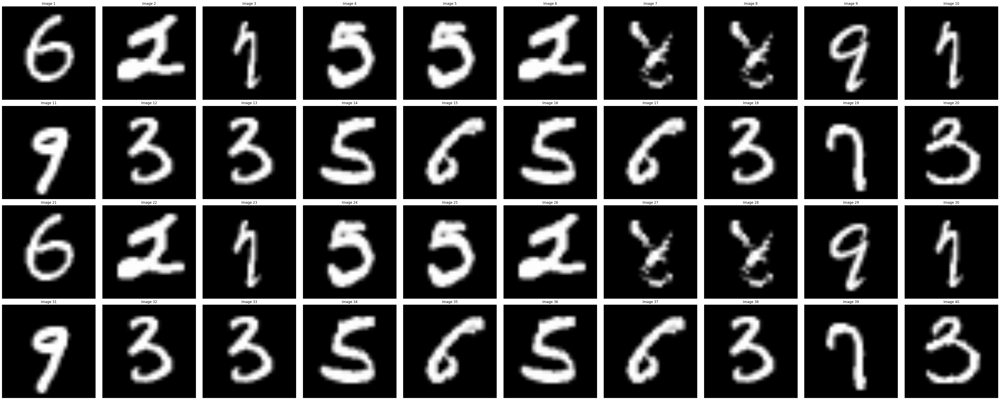

In [5]:
mats = [load_matrices(row['c_name'], row['m_name'], row['t_name'], test_dir=test_dir) for index, row in sorted_df.iloc[-32:-12].iterrows()]
show_grayscale_images([m['A'] for m in mats] + [m['U'] @ m['V'].transpose() for m in mats], 10)

In [6]:
# rerun(sorted_df.iloc[-2]['c_name'], sorted_df.iloc[-1]['m_name'], sorted_df.iloc[-2]['t_name'], changes={'k':10})

In [7]:
# rerun(sorted_df.iloc[-2]['c_name'], sorted_df.iloc[-2]['m_name'], sorted_df.iloc[-2]['t_name'], changes={'k':10})

after some testing it is evident that they are not error, are indeed good approximation computed with low k values, that generate an high objective function, now we will check other execution with low iteration > 1, not mnist and k > 1

In [4]:
x='t_name'
y='m_name'
remove_outliers = 0
logscale = (False, False)
font_size = 15

filter = {'n_iteration': lambda x: (x > 1) & (x < 10), 'c_name': lambda x: (x != 'mnist')}

fig = plot_agg_global_df(x=x, y=y, remove_outliers=remove_outliers, dataframe_path=df_path,
                         filter=filter, new_col=new_col, remove_col=remove_col,
                         logscale=logscale, title=title + ' - 2 to 9 Iteration Runs', font_size = font_size
                   )
fig.write_html('./data/plots/' + title.replace(' ', '_').lower() + '_' + str(next(counter)) + '.html')
fig.show()

k has only one value: 1


they all have k = 1 so for now we will assume that the algorithm always converge

# Analysis of Epsilon and Initialization Methods

In [5]:
x='dataset'
y='epsilon'
remove_outliers = 0
logscale = (False, False)
font_size = 15
fig_size = (1100, 500)


filter = {}

fig = plot_agg_global_df(x=x, y=y, remove_outliers=remove_outliers, dataframe_path=df_path,
                         filter=filter, new_col=new_col, remove_col=remove_col,
                         logscale=logscale, title=title + ' - Epsilon', font_size = font_size, fig_size= fig_size
                   )
fig.write_html('./data/plots/' + title.replace(' ', '_').lower() + '_' + str(next(counter)) + '.html')
fig.show()

m_name has too many categories
t_name has too many categories


In [6]:
x='n_iteration'
y='obj_fun_rel'
remove_outliers = 0
logscale = (True, False)
font_size = 15


filter = {}

fig = plot_agg_global_df(x=x, y=y, remove_outliers=remove_outliers, dataframe_path=df_path,
                         filter=filter, new_col=new_col, remove_col=remove_col,
                         logscale=logscale, title=title + ' - Epsilon', font_size = font_size
                   )
fig.write_html('./data/plots/' + title.replace(' ', '_').lower() + '_' + str(next(counter)) + '.html')
fig.show()

m_name has too many categories
t_name has too many categories


In [7]:
x='dataset'
y='init_method'
remove_outliers = 0
logscale = (False, False)
font_size = 15


filter = {}

fig = plot_agg_global_df(x=x, y=y, remove_outliers=remove_outliers, dataframe_path=df_path,
                         filter=filter, new_col=new_col, remove_col = remove_col,
                         logscale=logscale, title=title + ' - Initialisation Method', font_size = font_size
                   )
fig.write_html('./data/plots/' + title.replace(' ', '_').lower() + '_' + str(next(counter)) + '.html')
fig.show()

m_name has too many categories
t_name has too many categories
